In [1]:
from time import time
import scipy.io as sio
import numpy as np
import json  
from math import sqrt   
from SSA import SSA_H_Plus
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from termcolor import colored
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16,preprocess_input
import keras.preprocessing as preprocessing
from keras.models import Model
from keras.utils import load_img 
import numpy as np
import tensorflow as tf  
import saliency.core as saliency
from IPython.display import HTML, display
import tabulate
import PIL.Image 
import cv2

In [2]:
class FeatureExtractor:
    def __init__(self) :
        base_model=VGG16(weights='vgg16_weights.h5') 
        self.model=Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)
    def extract(self,img_path):
        img = load_img(img_path, target_size=(224, 224)) 
        img=img.convert('RGB')
        x=preprocessing.image.image_utils.img_to_array(img)
        x=np.expand_dims(x,axis=0)
        x=preprocess_input(x)
        feature=self.model.predict(x)[0]
        return feature/np.linalg.norm(feature)
    def extract_by_array(self,img_array): 
        x=np.expand_dims(img_array,axis=0)
        x=preprocess_input(x)
        feature=self.model.predict(x)[0]
        return feature/np.linalg.norm(feature)

In [8]:
class Saliency:
    def __init__(self) :
        m = VGG16(weights='vgg16_weights.h5')
        conv_layer = m.get_layer('block5_pool')
        self.model = Model([m.inputs], [conv_layer.output, m.output])
        
        self.class_idx_str = 'class_idx_str'
    def LoadImage(self,file_path):
        im = Image.open(file_path)
        im = im.resize((224,224))
        im = np.asarray(im)
        return im
    def PreprocessImage(self,im):
        im = preprocess_input(im)
        return im
    def call_model_function(self,images, call_model_args=None, expected_keys=None):
        target_class_idx =  call_model_args[self.class_idx_str]
        images = tf.convert_to_tensor(images)
        with tf.GradientTape() as tape:
            if expected_keys==[saliency.base.INPUT_OUTPUT_GRADIENTS]:
                tape.watch(images)
                _, output_layer = self.model(images)
                output_layer = output_layer[:,target_class_idx]
                gradients = np.array(tape.gradient(output_layer, images))
                return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}
            else:
                conv_layer, output_layer = self.model(images)
                gradients = np.array(tape.gradient(output_layer, conv_layer))
                return {saliency.base.CONVOLUTION_LAYER_VALUES: conv_layer,
                        saliency.base.CONVOLUTION_OUTPUT_GRADIENTS: gradients}
    
    def GetSaliency(self,input,trs):
        im_orig = self.LoadImage(input)
        im = self.PreprocessImage(im_orig)
        _, predictions = self.model(np.array([im]))
        prediction_class = np.argmax(predictions[0])
        call_model_args = {self.class_idx_str: prediction_class}
        xrai_object = saliency.XRAI()
        xrai_attributions = xrai_object.GetMask(im, self.call_model_function, call_model_args, batch_size=10)
        mask = xrai_attributions >= np.percentile(xrai_attributions, trs)
        im_mask = np.array(im_orig)
        im_mask[~mask] = 0
        # plt.imshow(mask)
        # plt.show()
        X_True=[]
        Y_True=[]

       


        for i in range(mask.shape[0]): 
            for j in range(mask.shape[1]):
                if(mask[i][j]):
                    X_True.append(i)
                    Y_True.append(j)
        X_True=list( dict.fromkeys(X_True) )
        Y_True=list(dict.fromkeys(Y_True))
        
        Xmin=min(X_True)
        XMax=max(X_True)
        Ymin=min(Y_True)
        YMax=max(Y_True)
        # im_mask = np.array(im_orig)
        # im_mask[~mask] = 0

        # im_mask=im_mask[Xmin:XMax,Ymin:YMax]  

        # return im_mask
        return im_orig[Xmin:XMax,Ymin:YMax]  


In [13]:
def getFolderAndFileName(imgPath):
    img_path_str=str(imgPath)
    img_path_splitted= img_path_str.split("/")
    return [img_path_splitted[len(img_path_splitted)-2],img_path_splitted[len(img_path_splitted)-1].replace(' ','')] 

In [14]:
img_path_lfw=[str(x) for x in sio.loadmat('cached-data/new/LFW/img_path_obj_lfw.mat')['img_path_obj']]
SSA_features=[x for x in sio.loadmat('cached-data/new/LFW/ssa_features_lfw.mat')['ssa_features']]
img_names=[getFolderAndFileName(x)[1] for x in img_path_lfw] 
img_folders=[getFolderAndFileName(x)[0] for x in img_path_lfw]  
all_results=[]

In [9]:
fe=FeatureExtractor() 
slc=Saliency()

In [15]:
# split_point=int(len(img_names)*.1)
split_point=10
count_of_results=5
training, test = img_names[split_point:], img_names[:split_point] 

Non Saliency part:

input:
Jiang_Zemin


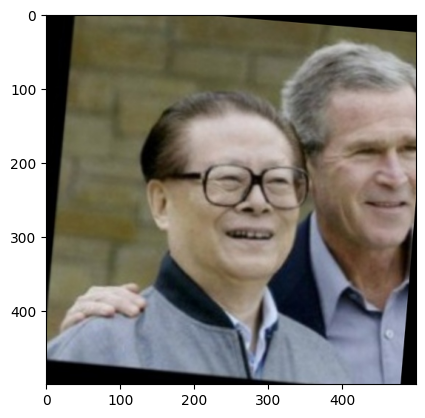

output:
George_HW_Bush


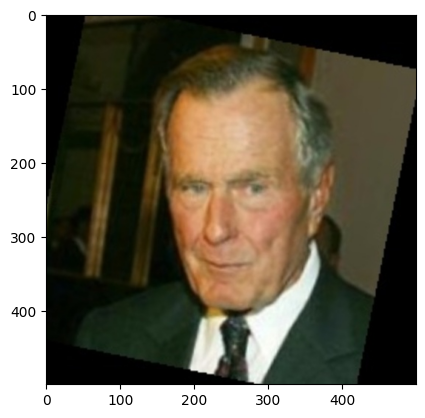

Mark_Hurlbert


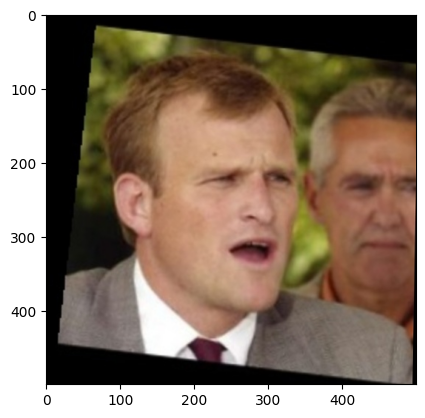

Tung_Chee-hwa


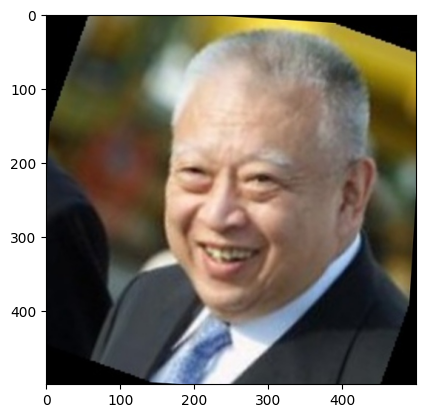

John_Kerry


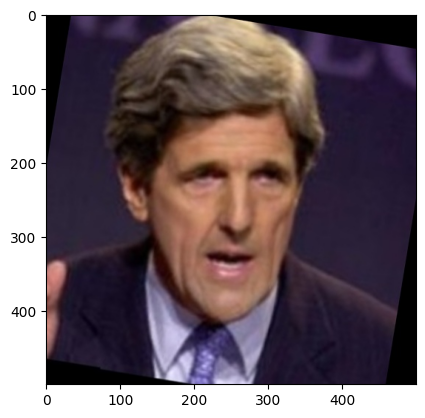

Jeong_Se-hyun


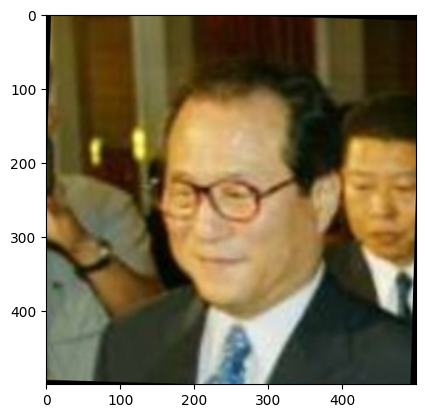

--------
input:
Jean-David_Levitte


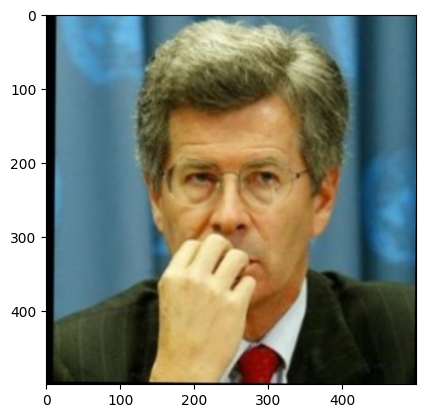

output:
Jose_Manuel_Durao_Barroso


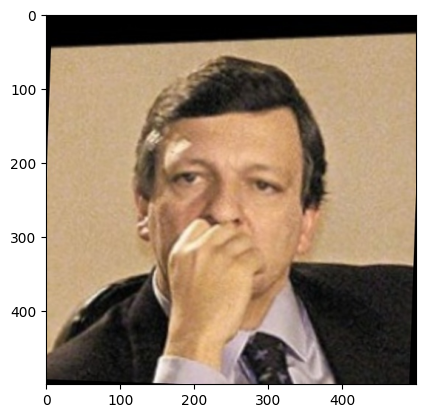

William_Ford_Jr


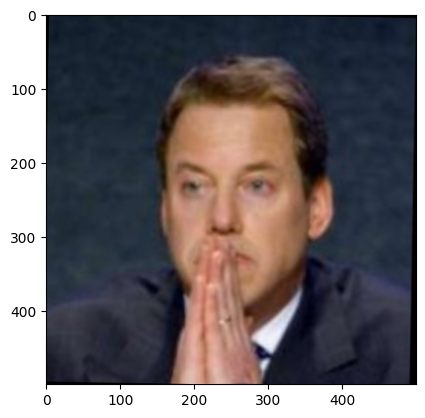

Mahmoud_Abbas


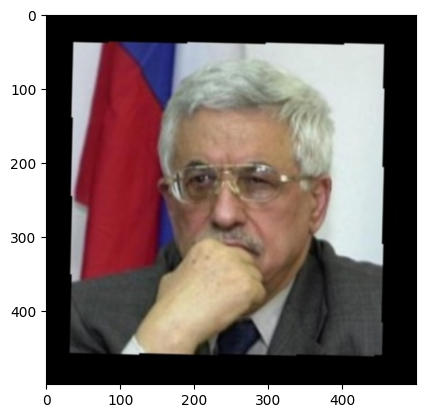

Gonzalo_Sanchez_de_Lozada


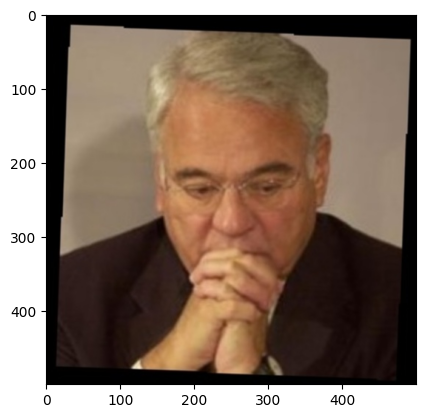

Michael_Phelps


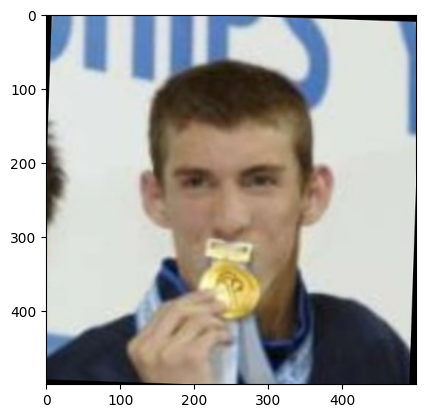

--------
input:
David_Wells


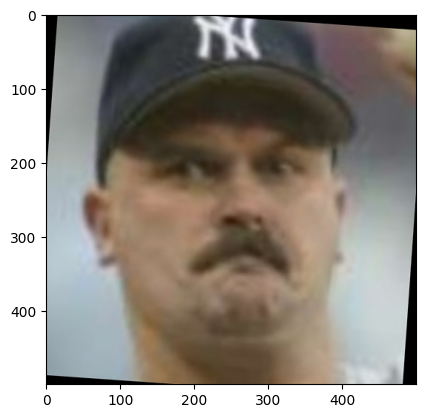

output:
David_Wells


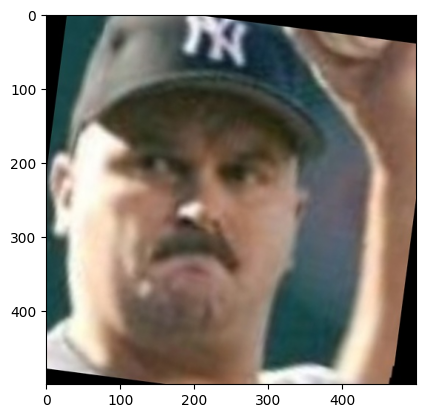

David_Wells


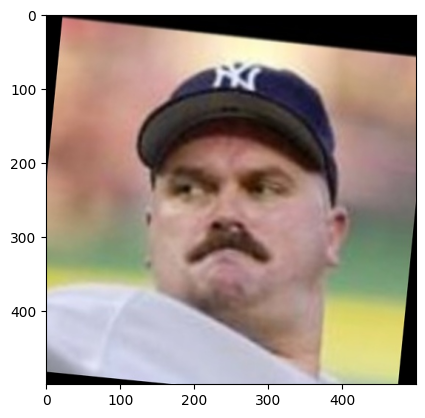

Sourav_Ganguly


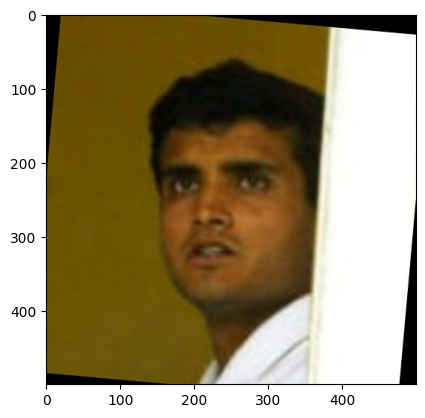

Ralf_Schumacher


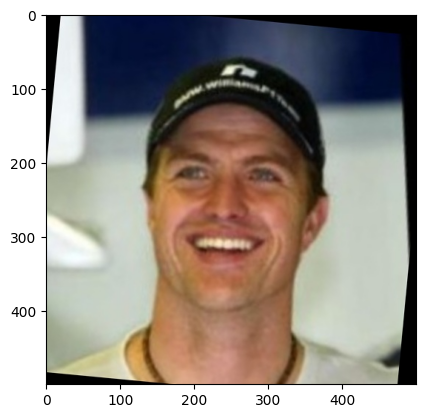

Jim_Furyk


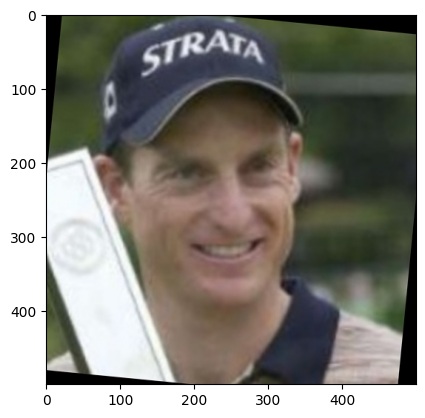

--------
input:
Brad_Johnson


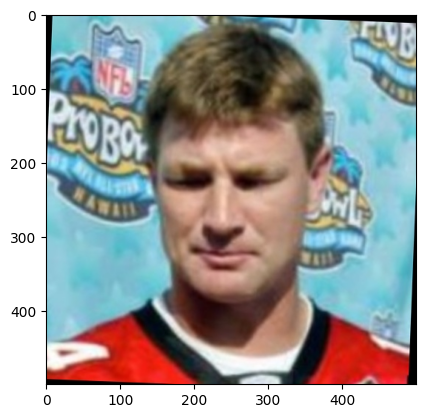

output:
Ian_Thorpe


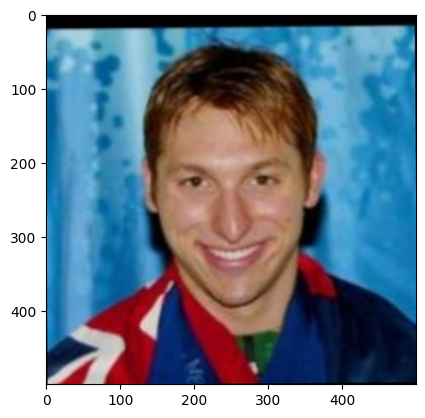

John_Edwards


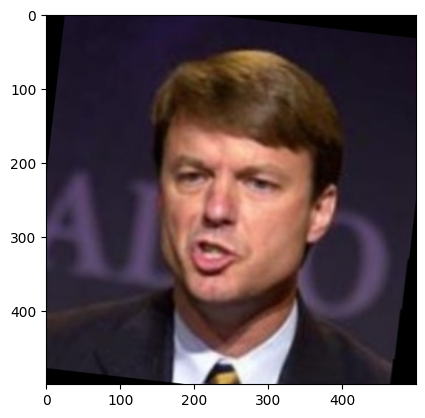

Rob_Marshall


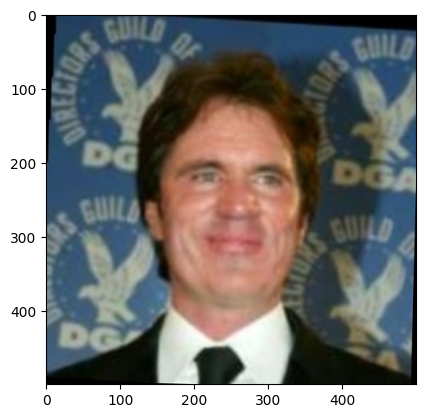

Mohamed_ElBaradei


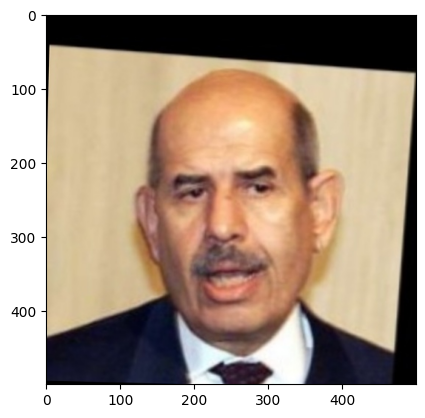

Ray_Romano


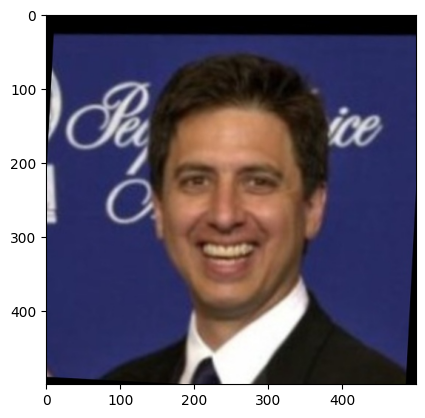

--------
input:
Gregg_Popovich


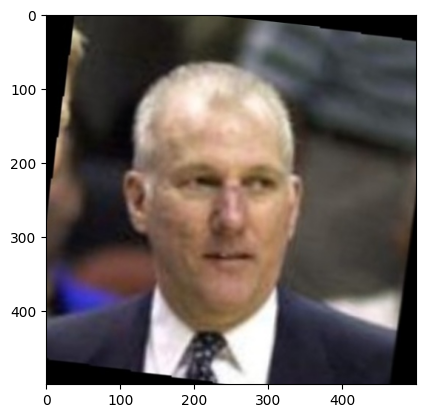

output:
Shimon_Peres


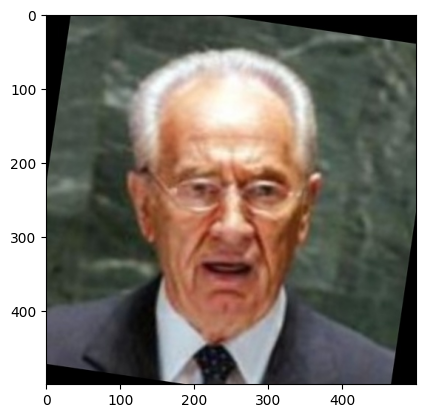

Michael_Bloomberg


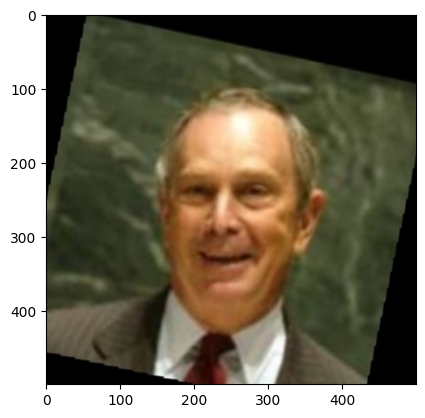

Paul_Burrell


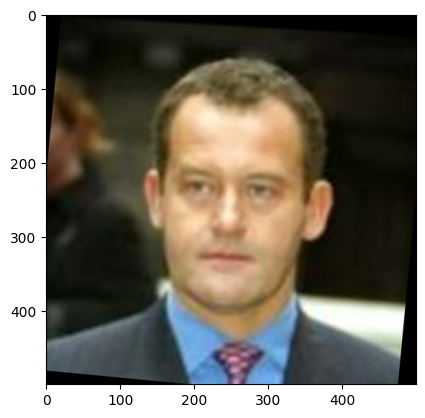

Colin_Powell


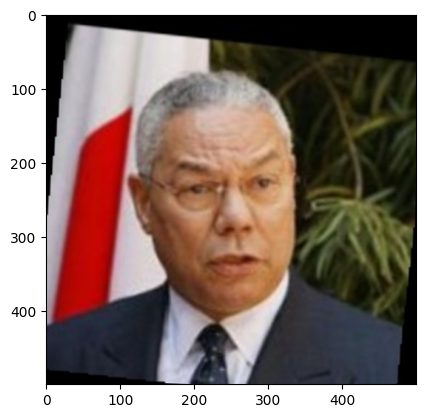

Yashwant_Sinha


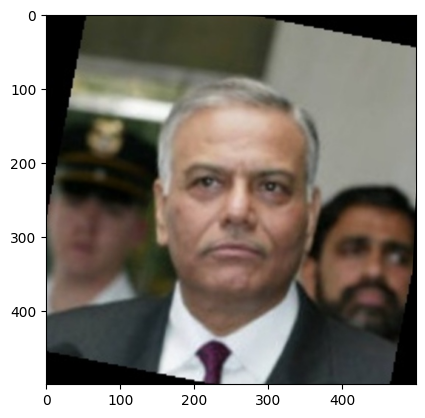

--------
input:
Gonzalo_Sanchez_de_Lozada


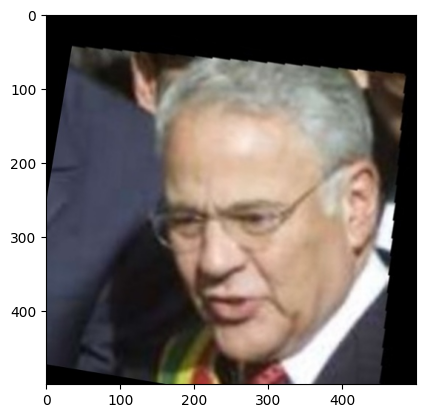

output:
George_Pataki


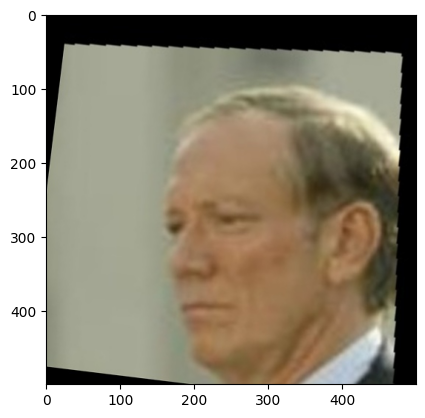

John_Ashcroft


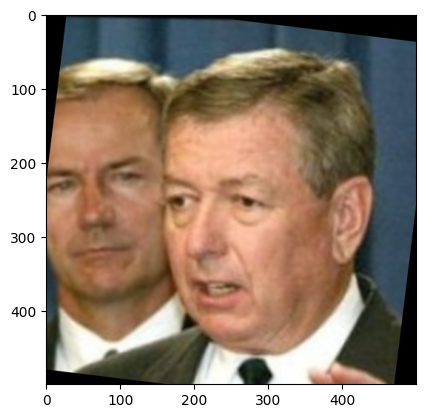

William_Donaldson


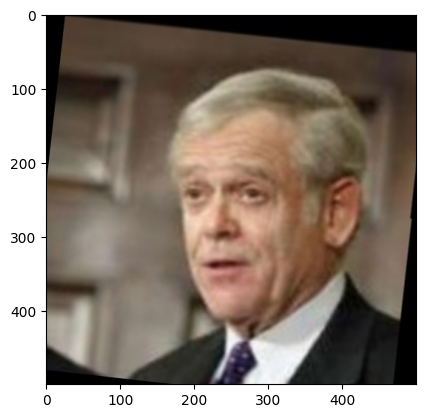

John_Manley


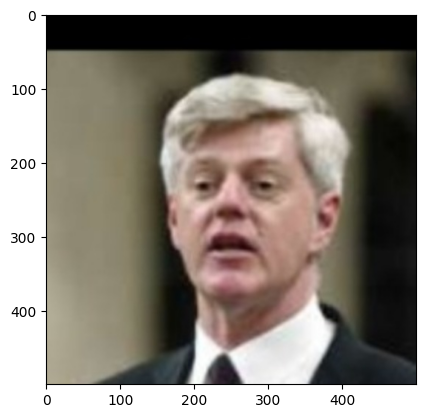

Li_Peng


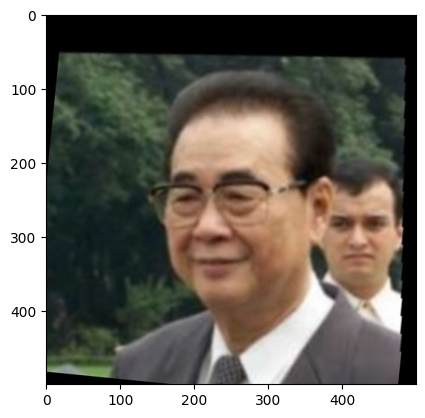

--------
input:
Fujio_Cho


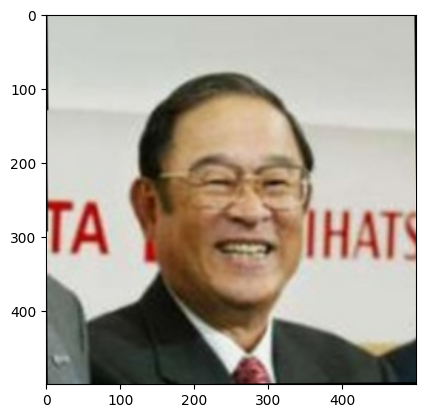

output:
Tang_Jiaxuan


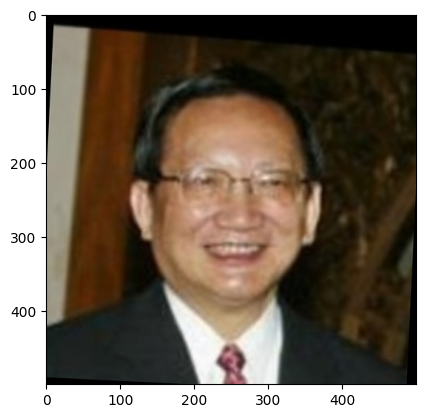

Li_Peng


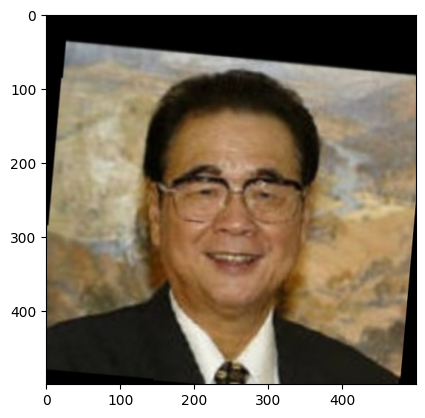

Roh_Moo-hyun


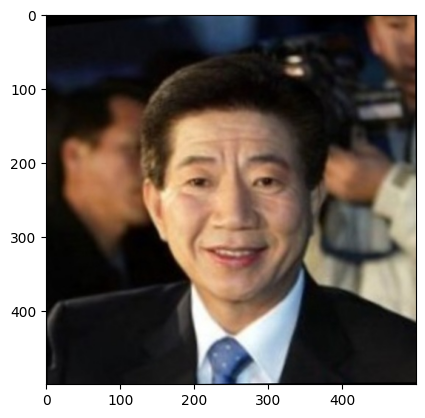

Vojislav_Kostunica


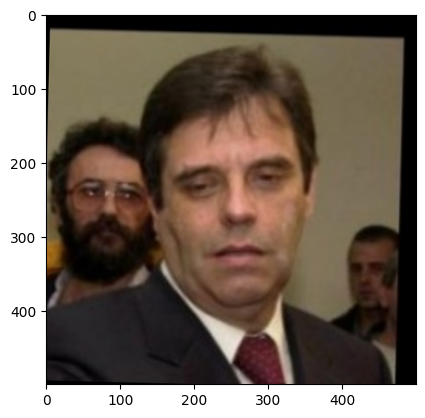

Ray_Romano


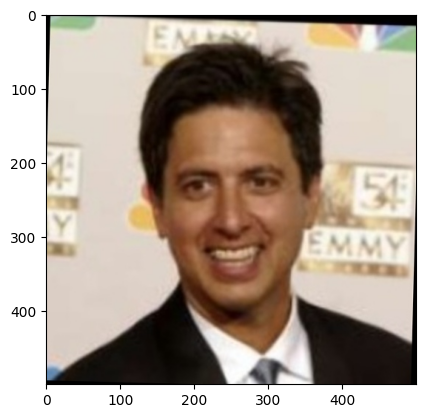

--------
input:
Vladimir_Putin


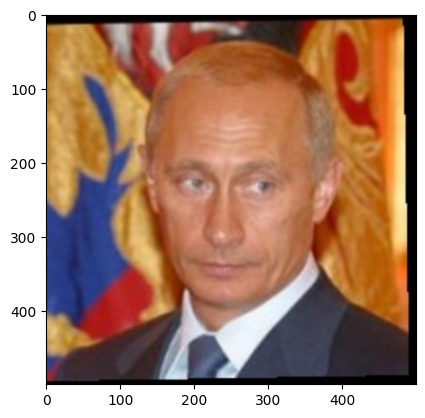

output:
Kim_Dae-jung


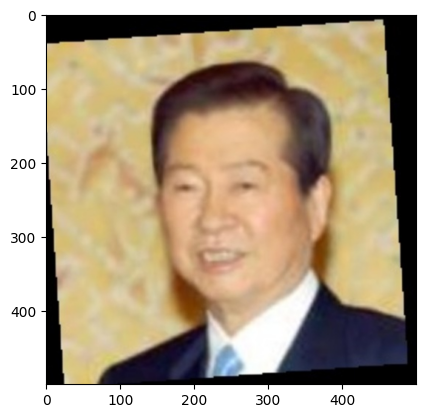

Billy_Crystal


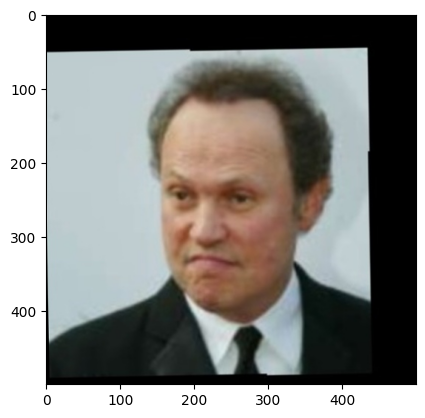

Ricardo_Lagos


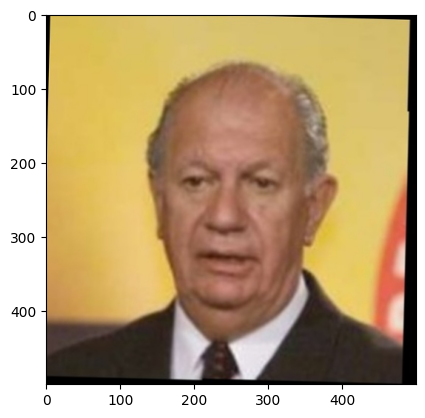

Lance_Armstrong


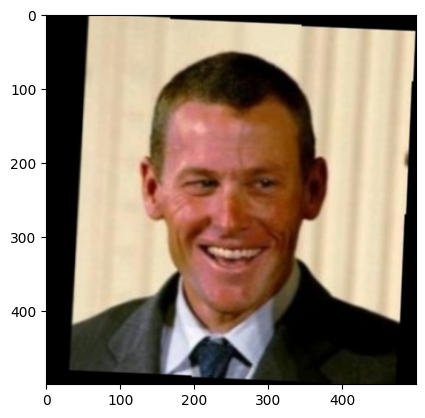

Vaclav_Havel


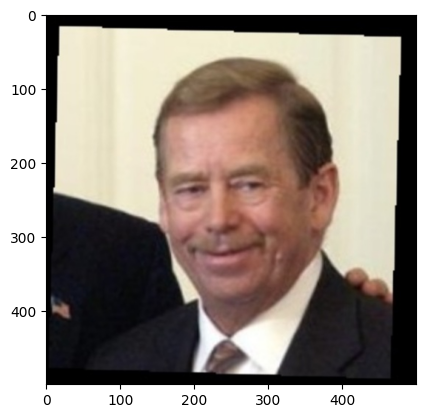

--------
input:
Gonzalo_Sanchez_de_Lozada


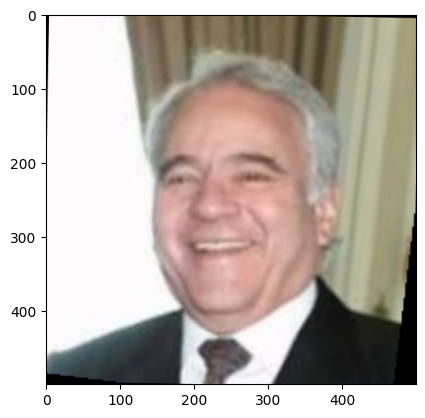

output:
Mohamed_ElBaradei


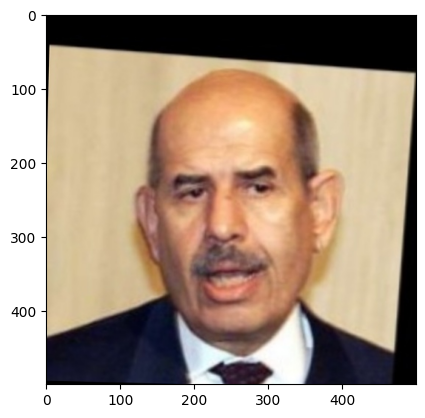

Bill_Gates


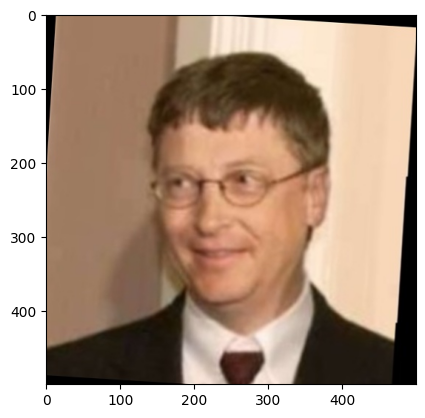

Jack_Straw


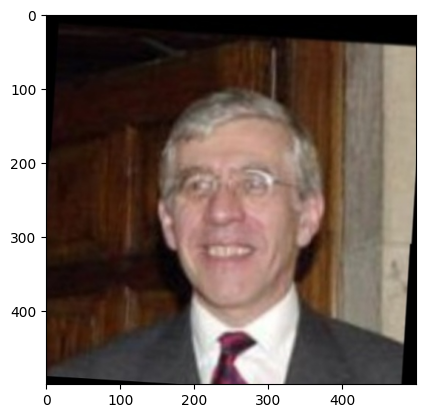

John_Ashcroft


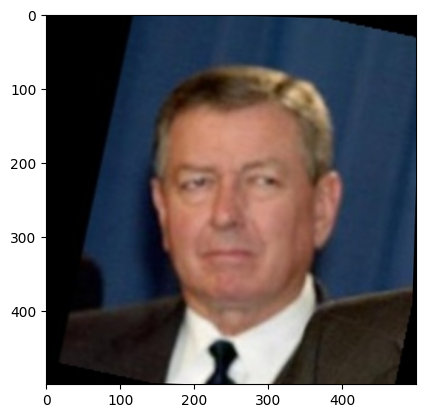

Romano_Prodi


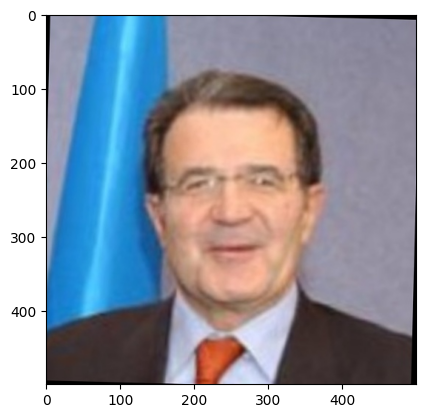

--------
input:
Hillary_Clinton


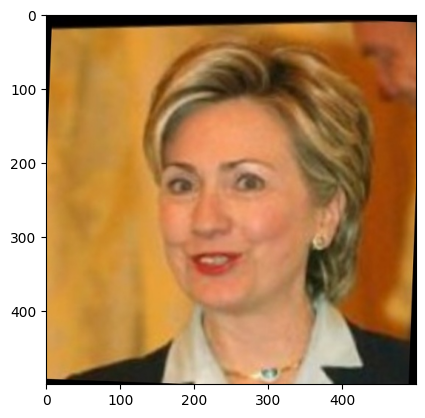

output:
John_Negroponte


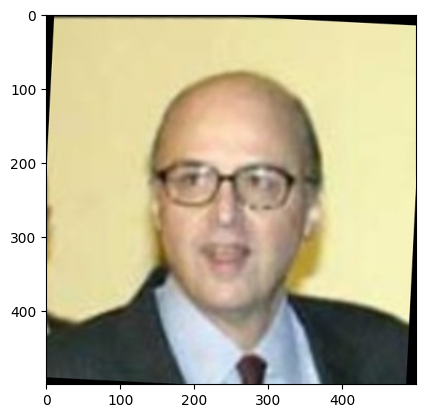

Keanu_Reeves


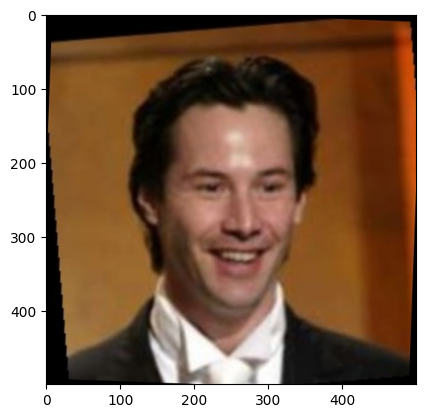

Saddam_Hussein


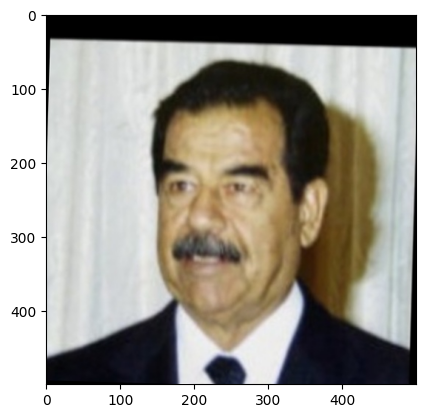

Clara_Harris


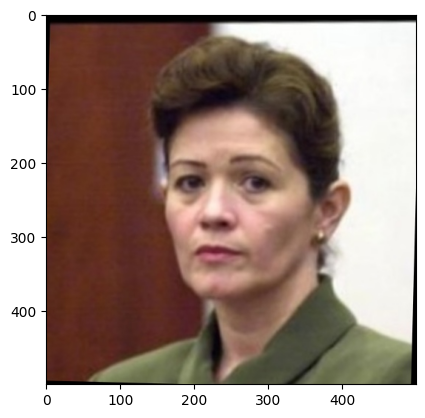

Jon_Gruden


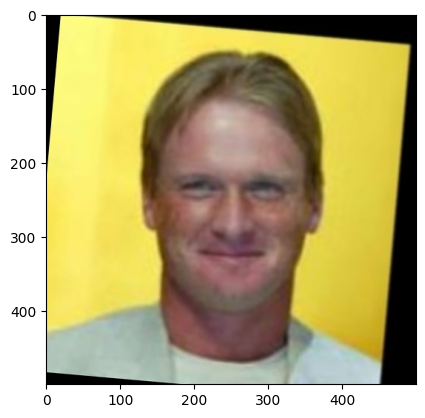

--------
Count Of True: 2
Count Of False: 48
Count Of All: 50


input,output1,output2,output3,output4,output5
Jiang_Zemin,George_HW_Bush,Mark_Hurlbert,Tung_Chee-hwa,John_Kerry,Jeong_Se-hyun
Jean-David_Levitte,Jose_Manuel_Durao_Barroso,William_Ford_Jr,Mahmoud_Abbas,Gonzalo_Sanchez_de_Lozada,Michael_Phelps
David_Wells,David_Wells,David_Wells,Sourav_Ganguly,Ralf_Schumacher,Jim_Furyk
Brad_Johnson,Ian_Thorpe,John_Edwards,Rob_Marshall,Mohamed_ElBaradei,Ray_Romano
Gregg_Popovich,Shimon_Peres,Michael_Bloomberg,Paul_Burrell,Colin_Powell,Yashwant_Sinha
Gonzalo_Sanchez_de_Lozada,George_Pataki,John_Ashcroft,William_Donaldson,John_Manley,Li_Peng
Fujio_Cho,Tang_Jiaxuan,Li_Peng,Roh_Moo-hyun,Vojislav_Kostunica,Ray_Romano
Vladimir_Putin,Kim_Dae-jung,Billy_Crystal,Ricardo_Lagos,Lance_Armstrong,Vaclav_Havel
Gonzalo_Sanchez_de_Lozada,Mohamed_ElBaradei,Bill_Gates,Jack_Straw,John_Ashcroft,Romano_Prodi
Hillary_Clinton,John_Negroponte,Keanu_Reeves,Saddam_Hussein,Clara_Harris,Jon_Gruden


In [16]:
count_of_true=0
count_of_false=0
count_of_all=0

AllData=[['input','output1','output2','output3','output4','output5']]
for input in test: 
    index_of_test=img_names.index(input)
    input_folder=img_folders[index_of_test] 
    thisrec=[input_folder] 
    print('input:')
    print(input_folder)
    img = mpimg.imread(img_path_lfw[index_of_test].replace(' ',''))
    imgplot = plt.imshow(img)
    plt.show()
    input_ssa=SSA_features[index_of_test]
    score_of_trained=[]
    for trained in training:
        index_of_trained=img_names.index(trained)
        trained_ssa=SSA_features[index_of_trained]
        distance= sqrt( sum(np.multiply(trained_ssa - input_ssa,trained_ssa - input_ssa)))
        trained_folder=img_folders[index_of_trained]
        score_of_trained.append([distance,trained,trained_folder])
    score_of_trained.sort()
    score_of_trained=score_of_trained[:count_of_results] 
    count_of_this_true=0
    print('output:')
    for res in score_of_trained:  
        if(res[2]==input_folder):
            print(colored(res[2],'green'))
            count_of_true=count_of_true+1
        else:
            print(colored(res[2],'red'))
            count_of_false=count_of_false+1
        
        thisrec.append(res[2])
        count_of_all=count_of_all+1 
        img=mpimg.imread(os.getcwd()+'/data-set/LFW/'+res[2]+'/'+res[1])
        imgplot=plt.imshow(img)
        plt.show() 
    print('--------')
    AllData.append(thisrec)    
AllData.append([count_of_all,0,0,0,0,count_of_true])
print('Count Of True: '+str(count_of_true))
print('Count Of False: '+str(count_of_false))
print('Count Of All: '+str(count_of_all))
table = tabulate.tabulate(AllData, tablefmt='html')
table

Saliency Part:

In [ ]:
count_of_true=0
count_of_false=0
count_of_all=0
AllData=[['input','output1','output2','output3','output4','output5']]

for input in test: 
    index_of_test=img_names.index(input)
    input_folder=img_folders[index_of_test] 
    salient=slc.GetSaliency(('data-set/dogs/images/Images/'+input_folder+'/'+input), 65)
    
    print('input:')
    print(input)
    print(input_folder) 

    imgplot = plt.imshow(salient)
    arr2im = PIL.Image.fromarray(salient)
    salient = arr2im.resize((224,224))
    salient = np.asarray(salient)
    salient_feature=fe.extract_by_array(salient)
    input_ssa=SSA_H_Plus(salient_feature)
    thisrec=[input_folder]  
    plt.show() 
    score_of_trained=[]
    for trained in training:
        index_of_trained=img_names.index(trained)
        trained_ssa=SSA_features[index_of_trained]
        distance= sqrt( sum(np.multiply(trained_ssa - input_ssa,trained_ssa - input_ssa)))
        trained_folder=img_folders[index_of_trained]
        score_of_trained.append([distance,trained,trained_folder])
    score_of_trained.sort()
    score_of_trained=score_of_trained[:count_of_results]
    new_rec={
        'input':input
        ,'class':input_folder,
        'output':[{'name':x[1],'class':x[2]} for x in score_of_trained]
    } 
    print('output:')
    for res in score_of_trained: 
        if(res[2]==input_folder):
            print(colored(res[2],'green'))
            count_of_true=count_of_true+1
        else:
            print(colored(res[2],'red'))
            count_of_false=count_of_false+1
        count_of_all=count_of_all+1
        thisrec.append(res[2])
        
        img=mpimg.imread(os.getcwd()+'/data-set/dogs/images/Images/'+res[2]+'/'+res[1])
        imgplot=plt.imshow(img)
        plt.show() 
        print('----')
    AllData.append(thisrec)    
AllData.append([count_of_all,0,0,0,0,count_of_true])
print('Count Of True: '+str(count_of_true))
print('Count Of False: '+str(count_of_false))
print('Count Of All: '+str(count_of_all))
table = tabulate.tabulate(AllData, tablefmt='html')
table